# Transfer Learning & Image Detection Tutorial

### Prepared by Ihsan Hepsen (İhsan Hepşen)

## This tutorial includes the following:
  * Computer Vision
  * Convolutional Neural Networks (CNN)
  * VGG Dataset
  * Transfer Learning and Pre-trained Models
  * Image Classification with VGG16
  * Hands-on Exercise: Classifying Celebrity Images With VGG16 Model

## Tutorial Goal
- This tutotral aims to teach the fundementals of computer vision, convolutional neural networks, using VGG dataset, and how to use a pre-trained model. Nowadays deeplearning is a huge concept. Computer vison is used in numerous fields in our lives. Therefore, this tutorial aims to guide you how to get started with computer vision and transfer learning.
- This tutorial will walk you through step by step on how to build an image classifier using a pre-trained model.

## Computer Vision

- Computer vision, abbreviated as CV, leverages AI to make computers to acquire useful data from visual sources such as images and videos. In this tutorial we are only going to use images. We will show celebrity images and define to AI how they need to be classified.

## Convolutional Neural Networks

- Convolutional neural networks, abbreviated as CNN, is an artifical neural network that has specialization at detecting patterns and reason on those patterns. CNN is extremely useful for image analysis thanks to its pattern detection capabilities. It is made up of convolutional layers, pooling layers, and fully connected layers.
- If CNN is just another neural network, what differentiates it from the other neural networks?
  * CNN is consisted of number of hidden layers called _convolutional_ layers, and these are the layers that precisely what makes a CNN, well, a CNN.

### Convolutional Layer
  - What do _**convolutional**_ layers do?
    * Similar to the other layers, convolutional layers receive input then transform the input in some way and then output the transform input to the next layer. With the convolutional layer, this transformation is called convolutional operation.
    * The convolutional layers are used to extract features from the image.
  - What are patterns?
    * An image is consisted of edges, shape, textures, shapes, objects et cetera, et cetera.
    * For instance, one convolutional layer can be used to detect all the edges in an image. In this case, this convolutional layer would be called _"edge detector"_.
    * As we continue in this notebook, we will use a convolutional neural network spcific to detect faces. More precisely, a neural network that is looking for two eyes, a nose, ears, lips, and so on.
- Let's have a look at the following figure to better understand how convolutional layers operate.

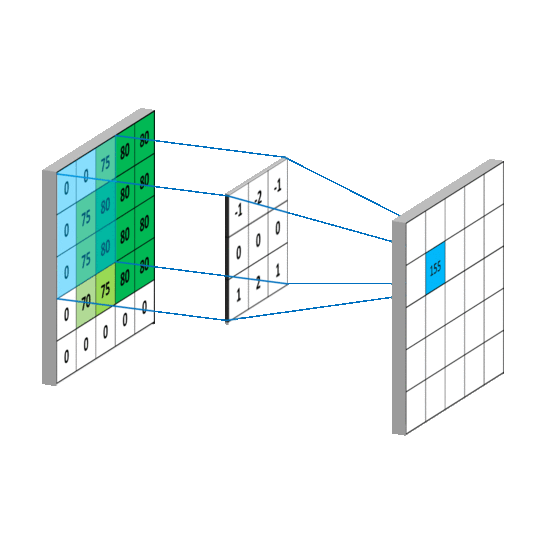

- The 3 by 3 matrix, also known as kernel, compresses an image and retrieves the most important feature. This feautre could be edges, or shapes, or you can even go deeper and extract the corners from an image.
- Different kernels are used to extract different features.
- Let's have a look at how different kernels can extract different features from the same image.

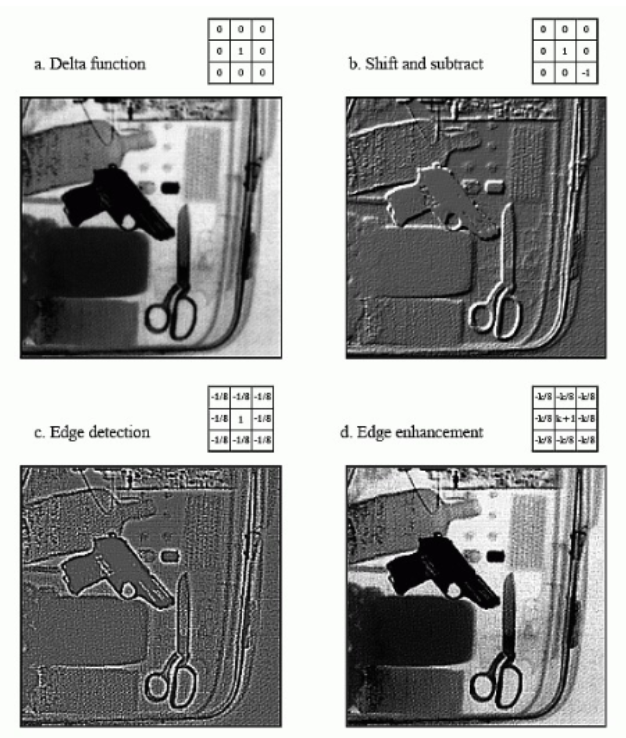

Notice how the values in the 3 by 3 matrix changes depending detection type.

### Pooling Layers
- Similar to convolutional layer, max pooling uses a matrix. This time however, it is a 2 by 2 matrix. This matrix goes over the image pixels and out of _pool_ of numbers inside of the 2 by 2 area, the matrix will select the maximum value.
- Why do we use max pooling?
  * Max pooling reduces the dimensionality of the given output of a convolutional layer. The network will be looking at larger areas of the image at a time going forward which reduces the number of parameters in the network. As a result, computational load will be reduced. Moreover, max pooling may help reduce overfitting too.
- You can inspect the max pooling process in the figure below.

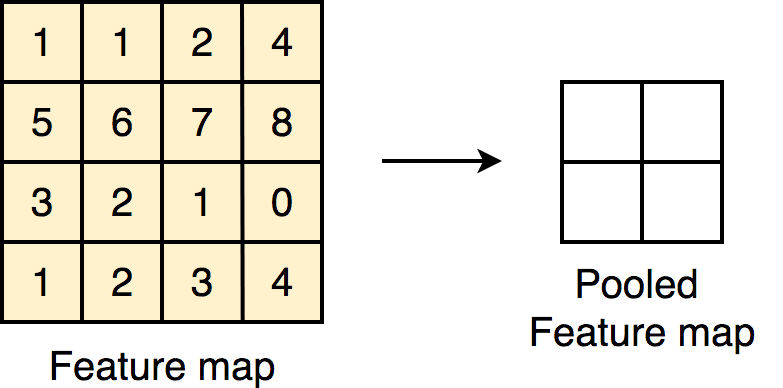

- There is also _*average pooling*_ which finds the average value out of the pool of numbers. However, max pooling is vastly used in convolutional networks and it is important to know that max pooling is **not** the only pooling technique.

- Max pooling in code:
```
MaxPooling2D(pool_size=(2, 2), strides=2, padding='valid')
```
  * `pool_size`: argument help us define the pool size, as seen from the previous example we will proceed with 2 by 2.
  * `strides`: specifies how far the pooling window moves for each pooling step
  * `padding`: either "valid" or "same". "valid" means no padding. "same" results in padding evenly to the left/right or up/down of the input such that output has the same height/width dimension as the input.

### Fully Connected Layers
- Convolutional Neural Networks (CNNs), which have demonstrated excellent performance in recognizing and classifying images for computer vision, must include fully connected layers as a fundamental part of their architecture. Dense layers are used to classify image based on output from convolutional layers.

## VGG Face Dataset

- The dataset contains 2,622 identities. A text file with URLs for photos and accompanying face detections is linked to each identity.
- Additional information can be found at the [official website](https://www.robots.ox.ac.uk/~vgg/data/vgg_face/).

- VGG dataset will be used in this notebook to load celebrity images.

## Transfer Learning, Pre-trained Models, and VGG16

### Transfer Learning

- Transfer learning can be defined as a problem in ML that focuses on storing knowledge gained while solving a problem and applying it to a related problem. For instance, knowledge gained from recognizing cars can be applied when predicting trucks.
- In simpler words, transfer learning can be defined as follows. A model is trained on a large dataset for car detection in images. Then, this model is saved to preserve the knowledge gained from its training. This model is also known as the pre-trained model. When someone wants to detect trucks in images they can use this pre-trained model to ease off their workload. Rather than building a model from scratch, we will use the existing knowledge from the pre-trained model.

### Pre-trained Models

- Pre-trained models are stored networks that have previously undergone training on a sizable dataset, commonly for a sizable image-classification task.
- Next section will cover VGG16, a pre-trained model that is used for image classifications.

### VGG16 Model

- VGG16 is a pre-trained model provided by tensorflow.
- VGG16 model is used in feature extraction, fine-tuning, and prediction models. By using Keras VGG16 weights are downloaded automatically by instantiating the model
- Detailed information on VGG16 model can be found [here](https://www.tensorflow.org/api_docs/python/tf/keras/applications/vgg16/VGG16).
- VGG16 model is trained on Imagenet dataset. This dataset includes hundreds and thousands of images. You can learn more about Imagenet [here](https://image-net.org/update-mar-11-2021.php).
- What to know about VGG16 model:
    * Consists of 16 layers.
    * Trained on Imagenet dataset.
    * The network has an image input size of 224-by-224.
    * You can classify new images using the VGG-16 model.

## Hands On Example: Celebrity Image Classification with VGG16

### What have you learned so far?
* Computer vision (CV).
* Convolutional neural networks (CNN).
* VGG Face dataset.
* Transfer learning and pre-trained models including VGG16.

- Without further ado, let's get started by importing all the necessary packages to get started with our example.

- Enabling GPU is advised for this example.

In [ ]:
import os
import cv2  # computer vision 2
import tarfile
import numpy as np
from urllib import request
from google.colab import drive
from google.colab.patches import cv2_imshow

import PIL.Image as Image

import tensorflow as tf
import tensorflow_hub as hub

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

base_path = "/content/sample_data/CV__Group_assignment"
SIZE = 224  # image size

### Example Overview

- In this example we are going to extract numerous images from four different celebrities from VGG dataset.
- Then we will build a model on top of th VGG16 (transfer learning) to classify our celebrity images.
- We will use 2 classes:
    * Class 0: "Female"
    * Class 1: "Male"
- Here are the celebrities and image quantities:
    * Margot Robbie *(person A)*: 
        * 20 train and 10 test images ~ Class 0
    * Ryan Reynolds *(person B)*: 
        * 20 train and 10 test images ~ Class 1
    * Megan Fox *(person C)*:
        * 10 test images ~ Class 0
    * Robert Pattinson *(person D)*: 
        * 10 test images ~ Class 1
- First, we will train our model with person A and person B. Then we will test our model with person C and D to observe how well our model will classify those images. Unlike images from person A and person B, person C and D will be a brand new situation for our model.

### Acessing VGG Face Dataset

- We will write a function to access VGG face dataset.

In [ ]:
def accss_vgg():

  if not os.path.isdir(base_path):
    os.makedirs(base_path)

  vgg_face_dataset_url = "http://www.robots.ox.ac.uk/~vgg/data/vgg_face/vgg_face_dataset.tar.gz"

  with request.urlopen(vgg_face_dataset_url) as r, open(os.path.join(base_path, "vgg_face_dataset.tar.gz"), 'wb') as f:
    f.write(r.read())

  with tarfile.open(os.path.join(base_path, "vgg_face_dataset.tar.gz")) as f:
    f.extractall(os.path.join(base_path))

  trained_haarcascade_url = "https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml"

  with request.urlopen(trained_haarcascade_url) as r, open(os.path.join(base_path, "haarcascade_frontalface_default.xml"), 'wb') as f:
    f.write(r.read())

### Loading Celebrity Images from VGG

- Now it is time to load celebrity images.
- We will also define a function to make things easier.

In [ ]:
def get_images_of(celeb_name: str, qty: int, class_type: int):
  all_subjects = [subject for subject in sorted(os.listdir(os.path.join(base_path, "vgg_face_dataset", "files"))) if subject.startswith(celeb_name) and subject.endswith(".txt")]

  nb_subjects = 1
  nb_images_per_subject = qty

  images = []
  labels = []
  counter = 1
  for subject in all_subjects[:nb_subjects]:

    with open(os.path.join(base_path, "vgg_face_dataset", "files", subject), 'r') as f:
      lines = f.readlines()

    images_ = []
    for line in lines:
      url = line[line.find("http://"): line.find(".jpg") + 4]

      try:
        res = request.urlopen(url)
        img = np.asarray(bytearray(res.read()), dtype="uint8")
        img = cv2.imdecode(img, cv2.IMREAD_COLOR)
        h, w = img.shape[:2]
        img = cv2.resize(img, (SIZE, SIZE))

        # check if there are multiple faces in the image
        face_cascade = cv2.CascadeClassifier(os.path.join(base_path, "haarcascade_frontalface_default.xml"))
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, 1.1, 4)

        if len(faces) == 1 and img not in images:
            images_.append(img)
            labels.append(class_type)
            print("Image", counter, "added")  
            cv2_imshow(img)
            counter += 1

      except:
        pass

      if len(images_) == nb_images_per_subject:
        images.append(images_)
        break
        
  return images, labels

- Let's have a look at the function `get_images_of`.
    * It takes 3 arguments:
        * `celeb_name`: Celebrity name.
        * `qty`: number of images we want back from VGG for the given celebrity.
        * `class_type`: what class does the celebrity belong to.
    * It returns 2 arrays:
        * images: contains all the images.
        * labels: contains all classification labels for the images.
    * Example usage:
        ```python
        margot_images, m_labels = get_images_of('Margot_Robbie', 30, 0)
        ```
    * Please Note:
        * If you inspect the code you will notice that there is a couple of preprocessing going on with the images. All you need to know about this preprocessing is that each image belonging to particular celebrity is checked if the image contains multiple faces, hence no group photos. The function also reshapes the images to 244 by 224 by 3 to make it easier to work with VGG16 model.

#### Loading & Preparing Celebrity Images

In [ ]:
accss_vgg()

Image 1 added


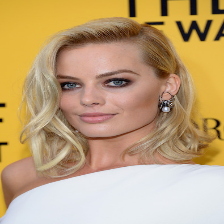

Image 2 added


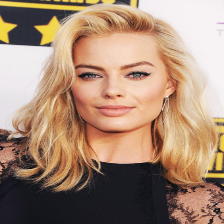

Image 3 added


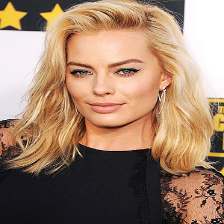

Image 4 added


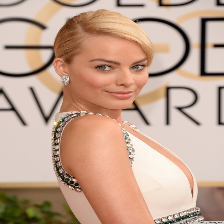

Image 5 added


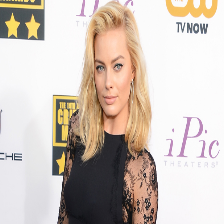

Image 6 added


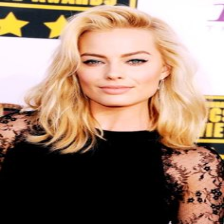

Image 7 added


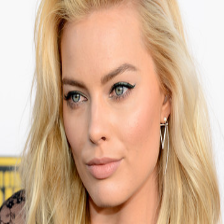

Image 8 added


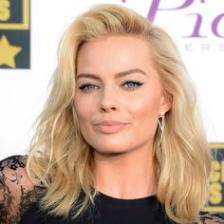

Image 9 added


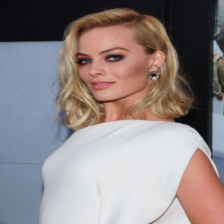

Image 10 added


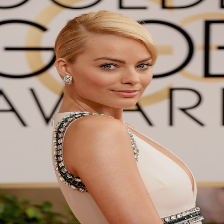

Image 11 added


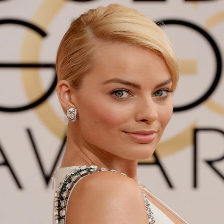

Image 12 added


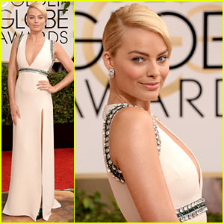

Image 13 added


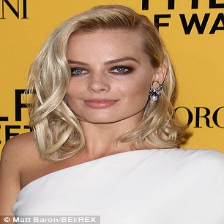

Image 14 added


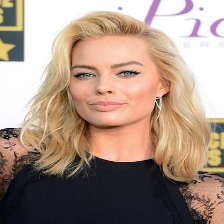

Image 15 added


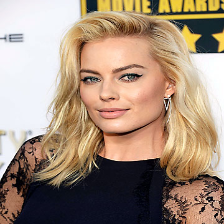

Image 16 added


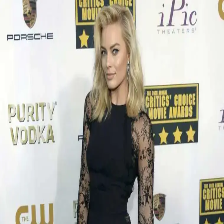

Image 17 added


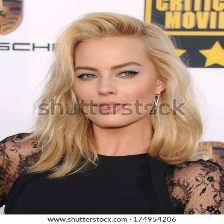

Image 18 added


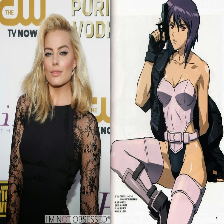

Image 19 added


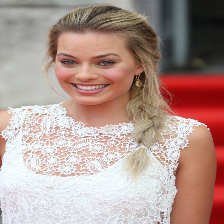

Image 20 added


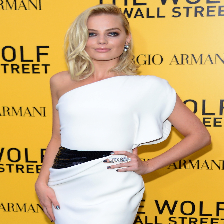

Image 21 added


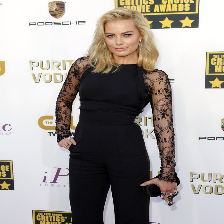

Image 22 added


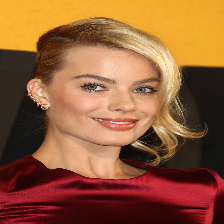

Image 23 added


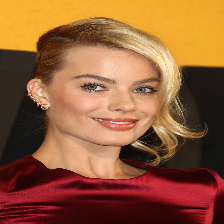

Image 24 added


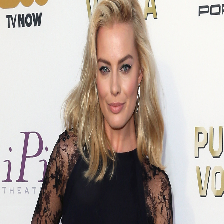

Image 25 added


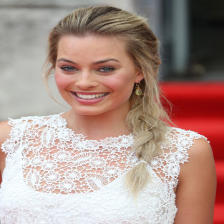

Image 26 added


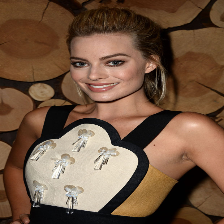

Image 27 added


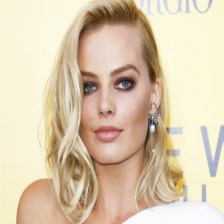

Image 28 added


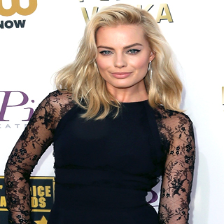

Image 29 added


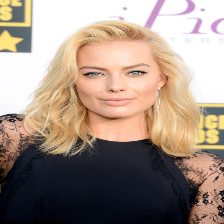

Image 30 added


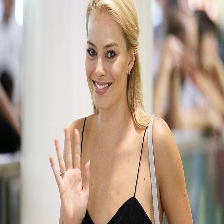

Image 1 added


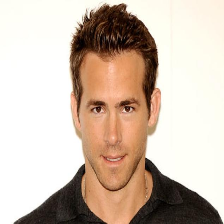

Image 2 added


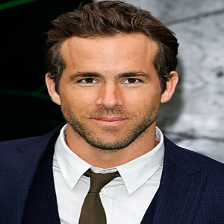

Image 3 added


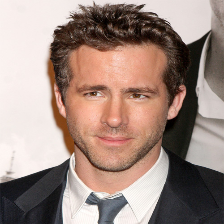

Image 4 added


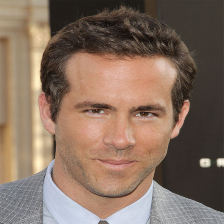

Image 5 added


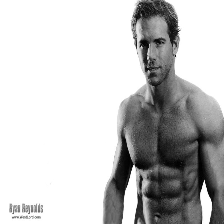

Image 6 added


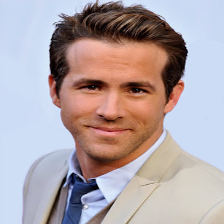

Image 7 added


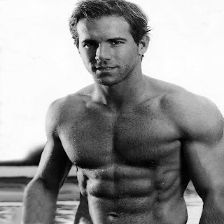

Image 8 added


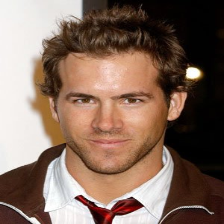

Image 9 added


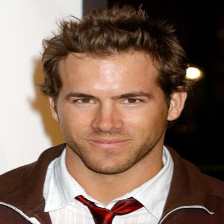

Image 10 added


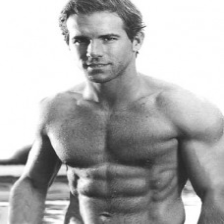

Image 11 added


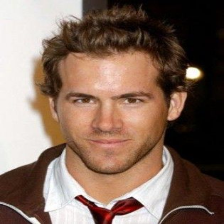

Image 12 added


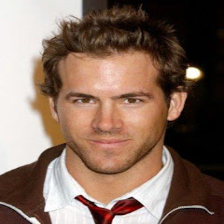

Image 13 added


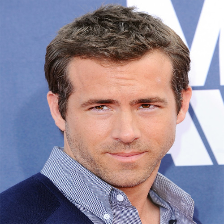

Image 14 added


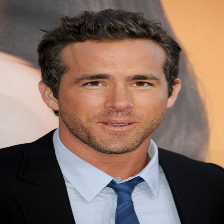

Image 15 added


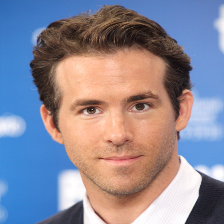

Image 16 added


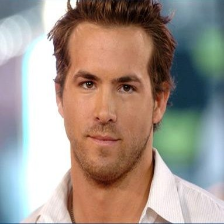

Image 17 added


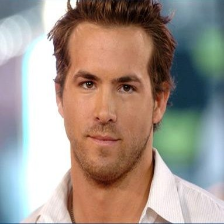

Image 18 added


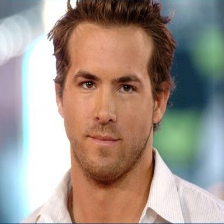

Image 19 added


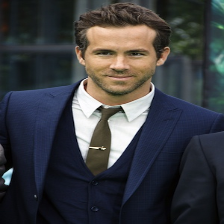

Image 20 added


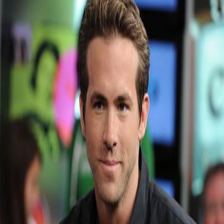

Image 21 added


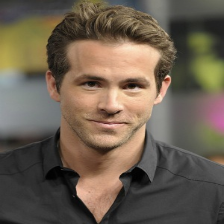

Image 22 added


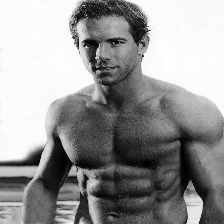

Image 23 added


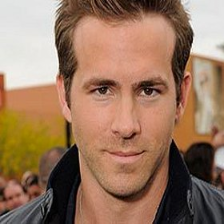

Image 24 added


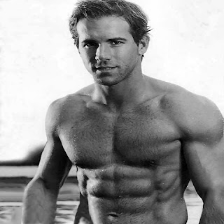

Image 25 added


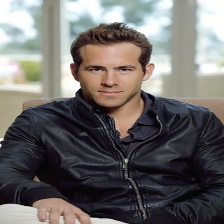

Image 26 added


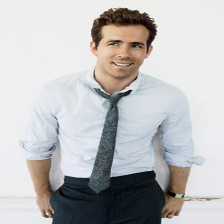

Image 27 added


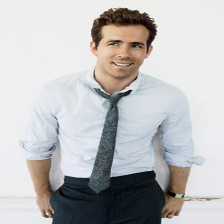

Image 28 added


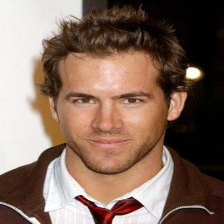

Image 29 added


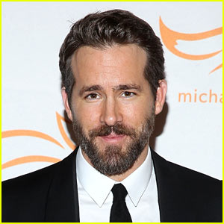

Image 30 added


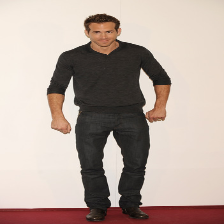

Image 1 added


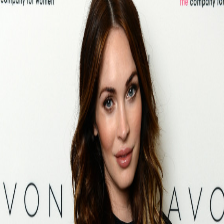

Image 2 added


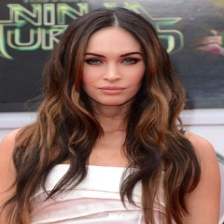

Image 3 added


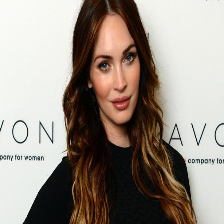

Image 4 added


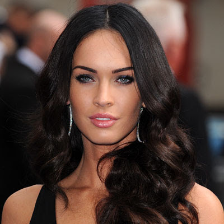

Image 5 added


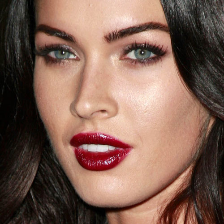

Image 6 added


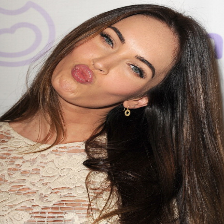

Image 7 added


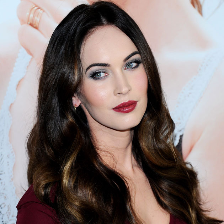

Image 8 added


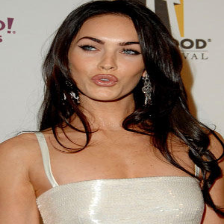

Image 9 added


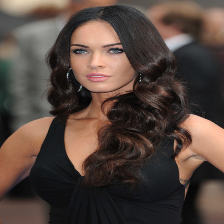

Image 10 added


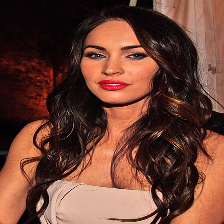

Image 1 added


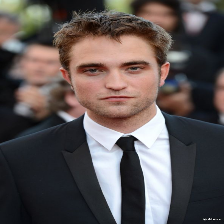

Image 2 added


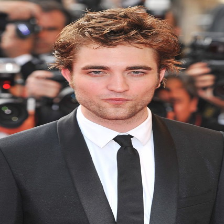

Image 3 added


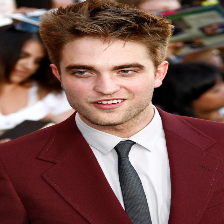

Image 4 added


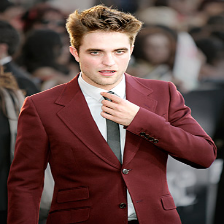

Image 5 added


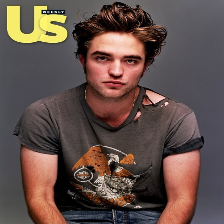

Image 6 added


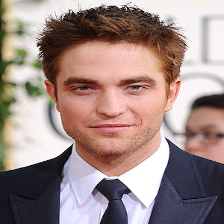

Image 7 added


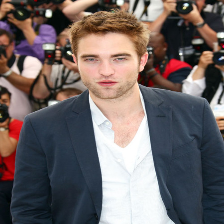

Image 8 added


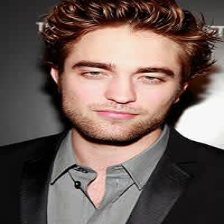

Image 9 added


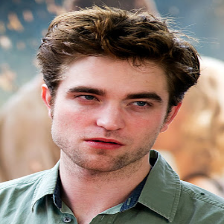

Image 10 added


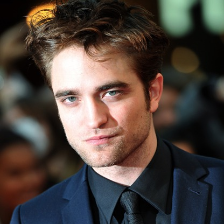

In [ ]:
# morgot robbie
margot_images, margot_labels = get_images_of('Margot_Robbie', 30, 0)

# ryan reynolds
ryan_images, ryan_labels = get_images_of('Ryan_Reynolds', 30, 1)

# megan fox
megan_images, _ = get_images_of('Megan_Fox', 10, 0)

# robert pattinson
robert_images, _ = get_images_of('Robert_Pattinson', 10, 1)

##### Splitting Images into Train & Test Sets

- The code cell below will split Margot's and Ryan's images into train and test sets. We do not do this for the other two celebrities because they will be used for testing only.

In [ ]:
train_images = []
train_labels = []

test_images = []
test_labels = []

for i in range(20):
    train_images.append(margot_images[0][i])
    train_labels.append(margot_labels[0])

    train_images.append(ryan_images[0][i])
    train_labels.append(ryan_labels[0])

for i in range(10):
    test_images.append(margot_images[0][-i])
    test_labels.append(margot_labels[0])

    test_images.append(ryan_images[0][-i])
    test_labels.append(ryan_labels[0])

In [ ]:
from keras.utils import to_categorical

train_labels = to_categorical(train_labels, num_classes=2)
test_labels = to_categorical(test_labels, num_classes=2)

### Importing VGG16

- In this section we import the VGG16 model to use it on our example.
- We can import the VGG16 as follows:

In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16

- VGG16 accepts image size of 224 x 224 x 3.
    * x 3 represents the RGB (red, green, blue) colors since we are also be working with colored images.
    * Remember the `SIZE` global variable we defined in the begining of this example? This is why we defined it.
- In the code cell below we will initialize our VGG16 model.

In [ ]:
base_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(SIZE, SIZE, 3))

- **Model's Parameter Explanation:**
    * `weights`: 'imagenet' (pre-training on ImageNet), or the path to the weights file to be loaded.
    * `include_top`: whether to include the 3 fully-connected layers at the top of the network.
        * This is set to `False`, meaning that you're not interested in the last layer of the model. Since models are visualized from bottom to top, that layer is referred to as the top layer. Excluding the top layers is important for feature extraction
    * `inpute_shape`: optional shape tuple, only to be specified if include_top is False (otherwise the input shape has to be (224, 224, 3). Last 3 represents red, green, and blue (RGB) layers.
- Please keep in mind that there are more parameters you can set. Learn more about VGG16 model parameters [here](https://www.tensorflow.org/api_docs/python/tf/keras/applications/vgg16/VGG16).

- We have successfully built VGG16 model.
- We will call it `base_model` as we are going to add a small model on top of this model.
- Next, we are going to set `trainable` attribute to false for this model because we do not want to re-train the model, we want to use the model's knowledge.

In [ ]:
# set trainable layers to false
for layer in base_model.layers:
    layer.trainable = False

### Adding new model on top of the Base Model(VGG16)

- We are going to use VGG16's output as our starting point.
- After that we will add couple of more layers.

In [ ]:
x = base_model.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.Dense(256, activation='relu')(x)
x = tf.keras.layers.Dense(2, activation='sigmoid')(x)
model = tf.keras.models.Model(inputs=base_model.input, outputs=x)

- Let's break down the model above a little:
    * I added a `GlobalAveragePooling2D` Layer:
        * Through the process of global pooling, all of the feature maps are combined into a single map that can be easily understood by a single dense classification layer as opposed to multiple layers. Typically, average pooling is used (GlobalAveragePooling2D).
    * After the average pooling layer, I added 2 more dense layer and finally, an output layer.
    * Unit values are decided based on rule of thumb.

#### Compile Model

In [ ]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

- Let's have a look at the model summary.

In [ ]:
model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

### Model Fitting

In [ ]:
model.fit(np.array(train_images), np.array(train_labels), epochs=30, batch_size=10)

Epoch 1/30
4/4 [==============================] - 1s 80ms/step - loss: 1.6966 - accuracy: 0.7750
Epoch 2/30
4/4 [==============================] - 0s 63ms/step - loss: 0.1815 - accuracy: 0.9750
Epoch 3/30
4/4 [==============================] - 0s 63ms/step - loss: 0.0444 - accuracy: 1.0000
Epoch 4/30
4/4 [==============================] - 0s 61ms/step - loss: 4.2410e-05 - accuracy: 1.0000
Epoch 5/30
4/4 [==============================] - 0s 60ms/step - loss: 1.7779e-05 - accuracy: 1.0000
Epoch 6/30
4/4 [==============================] - 0s 62ms/step - loss: 2.8716e-04 - accuracy: 1.0000
Epoch 7/30
4/4 [==============================] - 0s 63ms/step - loss: 8.7861e-04 - accuracy: 1.0000
Epoch 8/30
4/4 [==============================] - 0s 62ms/step - loss: 6.4646e-04 - accuracy: 1.0000
Epoch 9/30
4/4 [==============================] - 0s 62ms/step - loss: 7.1983e-05 - accuracy: 1.0000
Epoch 10/30
4/4 [==============================] - 0s 64ms/step - loss: 2.5277e-05 - accuracy: 1.0000
E

### Predicting Image Classes

- We will make another function to predict what class an image belongs to.
- This function will also draw a rectangle on faces.

### Predictions for Margot Robie and Ryan Reynolds

- Let's make a function that displays the image and image's class.

In [ ]:
def predict_image_class(image):
    img = cv2.resize(image, (SIZE, SIZE))
    img = np.reshape(img, [1, SIZE, SIZE, 3])

    face_cascade = cv2.CascadeClassifier(os.path.join(base_path, "haarcascade_frontalface_default.xml"))
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.1, 4)

    for (x, y, w, h) in faces:
        cv2.rectangle(image, (x, y), (x + w, y + h), (255, 0, 0), 2)

    cv2_imshow(image)
    prediction = model.predict(img)
    prediction = np.argmax(prediction, axis=1)

    if prediction == 0:
        print("Female")
    else:
        print("Male")

### Celebrity Image Classification

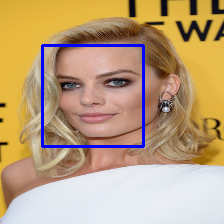

1/1 [==============================] - 0s 143ms/step
Female


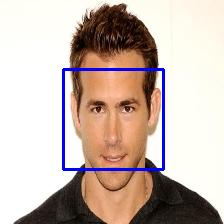

1/1 [==============================] - 0s 16ms/step
Male


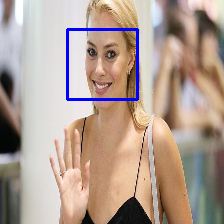

1/1 [==============================] - 0s 24ms/step
Male


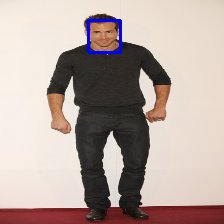

1/1 [==============================] - 0s 16ms/step
Male


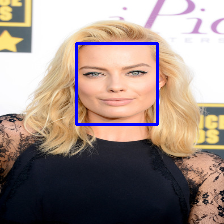

1/1 [==============================] - 0s 17ms/step
Female


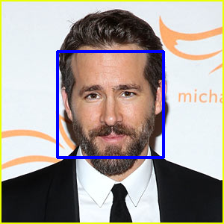

1/1 [==============================] - 0s 16ms/step
Male


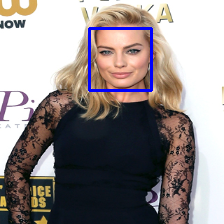

1/1 [==============================] - 0s 20ms/step
Female


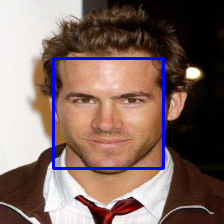

1/1 [==============================] - 0s 16ms/step
Male


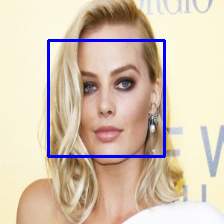

1/1 [==============================] - 0s 17ms/step
Female


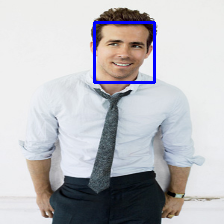

1/1 [==============================] - 0s 17ms/step
Male


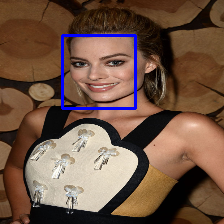

1/1 [==============================] - 0s 24ms/step
Female


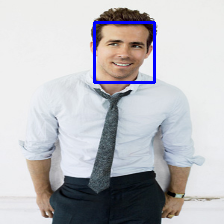

1/1 [==============================] - 0s 16ms/step
Male


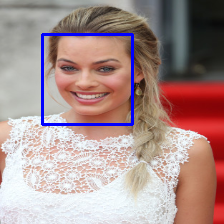

1/1 [==============================] - 0s 23ms/step
Female


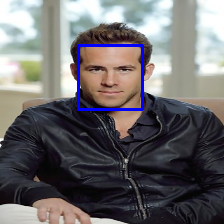

1/1 [==============================] - 0s 16ms/step
Male


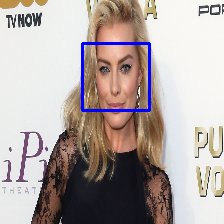

1/1 [==============================] - 0s 20ms/step
Female


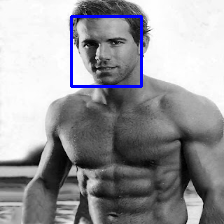

1/1 [==============================] - 0s 19ms/step
Male


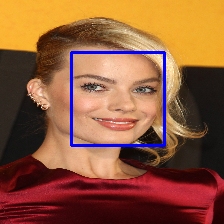

1/1 [==============================] - 0s 19ms/step
Female


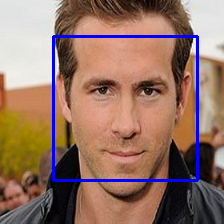

1/1 [==============================] - 0s 17ms/step
Male


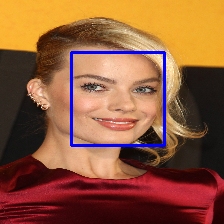

1/1 [==============================] - 0s 17ms/step
Female


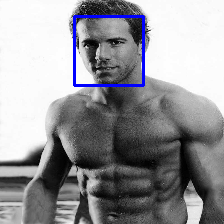

1/1 [==============================] - 0s 19ms/step
Male


In [ ]:
for i in range(len(test_images)):
    predict_image_class(test_images[i])

### Accuracy

In [ ]:
accuracy = model.evaluate(np.array(test_images), np.array(test_labels))
print(accuracy[1])

- 95% accuracy for the images which our model is familiar with. Pretty good!

### Predictions for Megan Fox and Robert Pattinson

- Predictions for Robert Pattinson.

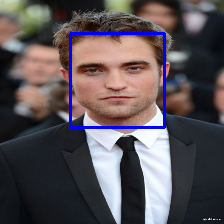

1/1 [==============================] - 0s 17ms/step
Male


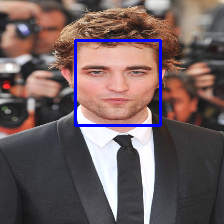

1/1 [==============================] - 0s 18ms/step
Male


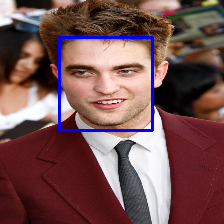

1/1 [==============================] - 0s 16ms/step
Male


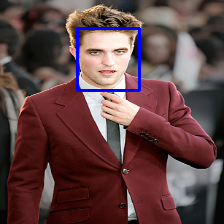

1/1 [==============================] - 0s 17ms/step
Male


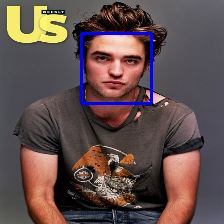

1/1 [==============================] - 0s 16ms/step
Female


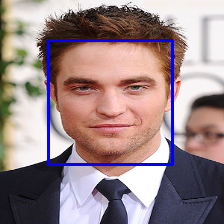

1/1 [==============================] - 0s 29ms/step
Male


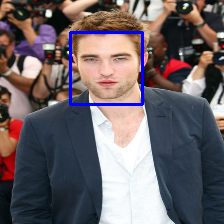

1/1 [==============================] - 0s 23ms/step
Male


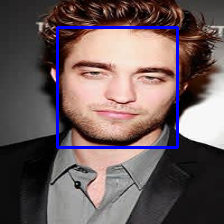

1/1 [==============================] - 0s 18ms/step
Male


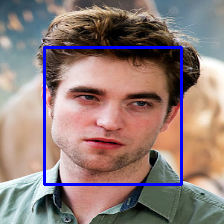

1/1 [==============================] - 0s 19ms/step
Male


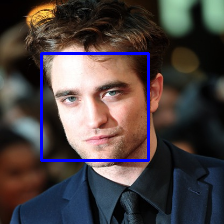

1/1 [==============================] - 0s 28ms/step
Male


In [ ]:
for i in range(10):
    predict_image_class(robert_images[0][i])

- Predictions for Megan Fox. 

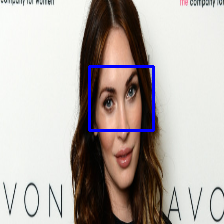

1/1 [==============================] - 0s 21ms/step
Female


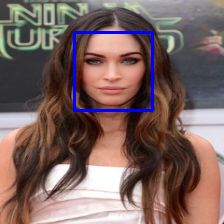

1/1 [==============================] - 0s 19ms/step
Female


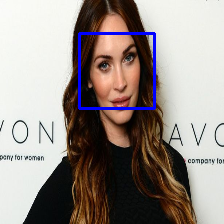

1/1 [==============================] - 0s 16ms/step
Female


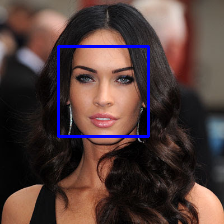

1/1 [==============================] - 0s 19ms/step
Male


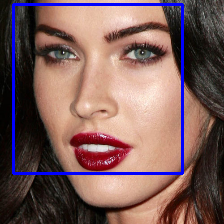

1/1 [==============================] - 0s 18ms/step
Male


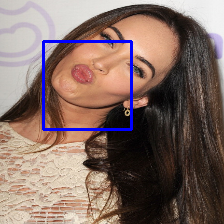

1/1 [==============================] - 0s 17ms/step
Female


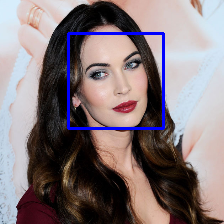

1/1 [==============================] - 0s 21ms/step
Female


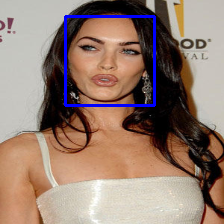

1/1 [==============================] - 0s 16ms/step
Female


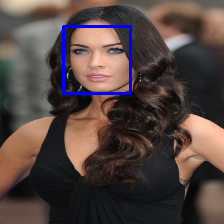

1/1 [==============================] - 0s 17ms/step
Female


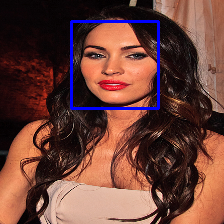

1/1 [==============================] - 0s 31ms/step
Female


In [ ]:
for i in range(10):
    predict_image_class(megan_images[0][i])

### Accuracy
- Our model was able to correctly classify 19 images out of 20.
- 95% accuracy for the unseen images. Impressive results considering all the images have different features compared to images that we trained the model with.

### Let's Break The Model

- The model we just built with transfer learning can detect females and males. Though, we only used similar persons to train and test. What would happen if we give the model a completely different image?
- Our model heavily relies on hair when predicting females. Both Margot Robbie and Megan Fox has long hair. For the male class though, our model thinks a male is someone with none to a little beard and short hair.
- I will load an image of Jason Mamoa to prove the statements above. Jason Momoa has long hair. Even though he has long beard, his beard will not be enough to get classified as "male".

Image 1 added


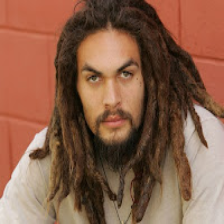

In [ ]:

# jason momoa
jason_images, _ = get_images_of('Jason_Momoa', 1, 1)

#### Breaking the classifier

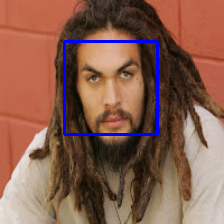

1/1 [==============================] - 0s 19ms/step
Female


In [ ]:
predict_image_class(jason_images[0][0])

- As we can realize our model thinks Jason Mamona is a female due to his long hair.
- What else do you think would break the classifier? It will also break the classifier if you block the person's eyes and mouth. Maybe you can try this as an exercise.

## Summary

- Congratulations! You have come a long way.
- In this tutorial you have learned:
    * What is Computer Vision (CV).
    * What is Convolutional Network and how it works.
    * Transfer learning.
    * Working with pre-trained models.
    * Working with VGG face dataset.
    * Extracting images from VGG face dataset.
    * Using VGG16 in for image classification.

- This was a transfer learning tutorial by Ihsan Hepsen. I hope you did not only enjoyed the entire journey, but also learned the topics throughly. Have fun with computer vision and image classification! Please feel free to download and use this notebook in your studies. I will see you in the next one.